# NEURAL NETWORKS AND DEEP LEARNING
---
### A.A. 2020/21 (6 CFU) - Dr. Alberto Testolin, Dr. Matteo Gadaleta
---

Segalini Beatrice, student ID 1234430

> M.Sc. PHYSICS OF DATA
>
> Department of Physics and Astronomy
 
-----


# Homework 2 - Unsupervised Deep Learning

In [16]:
# Pytorch
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as Data
from torch.utils.data import Dataset, DataLoader
from torchvision.utils import save_image
from torch.autograd import Variable

# Pytorch lightning 
import pytorch_lightning as pl
from pytorch_lightning import Callback
from pytorch_lightning.callbacks.early_stopping import EarlyStopping

# Optuna for gridsearch
import optuna
from optuna.integration import PyTorchLightningPruningCallback

#Utilities
import pandas as pd
import numpy as np
import random
import os
import sys
import glob
import json
import joblib
from rich.jupyter import print
from tqdm import tqdm

# Other useful stuff
from sklearn.model_selection import KFold, train_test_split
from scipy.stats import loguniform 

# Images and plots
import matplotlib.pyplot as plt
%matplotlib inline
import imageio
import plotly.express as px

# For visualization of encoded space 
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from matplotlib.patches import Ellipse

# reproducibility, use Student ID as seed
torch.manual_seed(1234430)    
np.random.seed(1234430)

# device
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

## Dataset

### Define data transformations

Three data transformations are defined:
- a simple transformation to pytorch tensor: ``to_tensor``
- ``to_tensor`` combined with a normalization to the mean and standard deviation of the MNIST dataset: ``norm_transf``
- ``to_tensor`` combined with a random choice of tranformations to enhance the dataset, i.e. a random rotation of an angle in the (-45°,45°) interval or some gaussian noise, with kernel of 5 pixels: ``transformation``

In [2]:
to_tensor = torchvision.transforms.Compose([ torchvision.transforms.ToTensor(), ])

# when downloading the datasets, performs two basic transformations, composing them:
#  - ToTensor() as usual
#  - Normalize((0.1307,), (0.3081,)) to normalise data mean providing mean and standard deviation respectively 

norm_transf = torchvision.transforms.Compose( [torchvision.transforms.ToTensor(),
                                               torchvision.transforms.Normalize((0.1307,), (0.3081,))] )

# then we define some more tranformations to enhance the dataset: 
#  - a random rotation of an angle in the (-45°,45°) interval
#  - some gaussian noise, with kernel of 5 pixels
# The transformations are chosen randomly with the RandomChoice option, and then composed with the 
# first transformation

rotation_45 = torchvision.transforms.RandomRotation(45)
gauss_noise = torchvision.transforms.GaussianBlur(5)
choose_tran = torchvision.transforms.RandomChoice([rotation_45, gauss_noise])

transformation = torchvision.transforms.Compose( [ choose_tran, norm_transf] )

In [3]:
train_dataset_full = torchvision.datasets.MNIST('dataset', train=True, download=True, transform=to_tensor)
test_dataset       = torchvision.datasets.MNIST('dataset', train=False, download=True, transform=to_tensor)

### Plot some randomly chosen samples

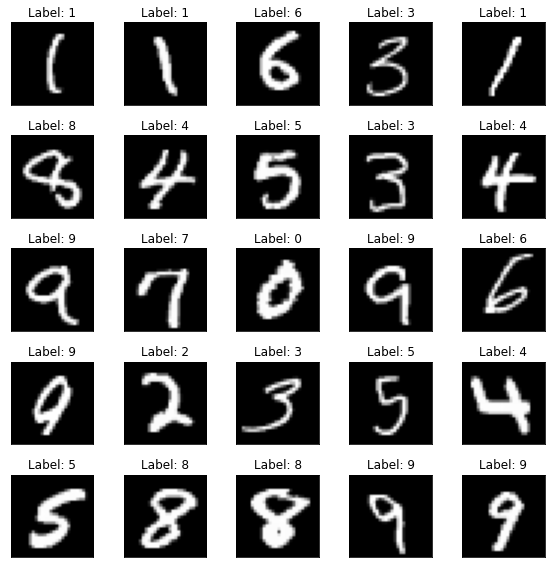

In [4]:
fig, axs = plt.subplots(5, 5, figsize=(8,8))
for ax in axs.flatten():
    # random.choice allows to randomly sample from a list-like object (basically anything that can be accessed with an index, like our dataset)
    img, label = random.choice(train_dataset_full)
    ax.imshow(np.array(img[0]), cmap='gist_gray')
    ax.set_title('Label: %d' % label)
    ax.set_xticks([])
    ax.set_yticks([])
plt.tight_layout()

In [5]:
# prepare validation set by splitting the train one
train_dataset, valid_dataset = torch.utils.data.random_split(train_dataset_full, [int(0.8*len(train_dataset_full)),int(0.2*len(train_dataset_full))])

print('Train samples:', len(train_dataset), '\nValidation samples:', len(valid_dataset), '\nTest samples:', len(test_dataset))

# set up dataloaders
train_load = Data.DataLoader(train_dataset, batch_size=256, shuffle=True, num_workers=0)
valid_load = Data.DataLoader(valid_dataset, batch_size=256, shuffle=False, num_workers=0)

test_load  = Data.DataLoader(test_dataset, batch_size=256, shuffle=False)

In [6]:
batch_data, batch_labels = next(iter(train_load))
print(f"TRAIN BATCH SHAPE")
print(f"\t Data: {batch_data.shape}")
print(f"\t Labels: {batch_labels.shape}")

batch_data, batch_labels = next(iter(test_load))
print(f"TEST BATCH SHAPE")
print(f"\t Data: {batch_data.shape}")
print(f"\t Labels: {batch_labels.shape}")

## Support functions

In [7]:
loss_func = nn.MSELoss()

In [8]:
DIR = os.getcwd()
MODEL_DIR = os.path.join(DIR, "results")
if not os.path.exists(MODEL_DIR):
    os.makedirs(MODEL_DIR)
print(MODEL_DIR)

## Autoencoder - Random search for hyperparameters optimization

Define Autoencoder class via Pytorch Lightining. Implement also Optuna features for hyperparameters optimization.

In [9]:
class AutoEncoder_optuna(pl.LightningModule):

    def __init__(self, trial):

        super().__init__()
        
        # optuna functionality for selecting initial value.                                                                  
        encoded_space_dim = trial.suggest_int('encoded_space_dim', 2, 100) # sampled from the integers in [2,100]
        n_channels = trial.suggest_int('n_channels', 4, 10)                # sampled from the integers in [4,10]
        
        self.trial = trial
        
        # Encoder
        self.encoder = nn.Sequential( # First convolutional layer
                                      # --> img size = (28-3+2*1)/2+1= 15x15 
                                      nn.Conv2d(1, n_channels, kernel_size=3, padding=1, stride=2),
                                      nn.ReLU(),
                                      # Second convolutional layer
                                      # --> img size = (15-3+2*1)/2+1= 8x8 
                                      nn.Conv2d(n_channels, 2*n_channels, kernel_size=3, padding=1, stride=2),
                                      nn.ReLU(),
                                      # Third convolutional layer
                                      # --> img size = (8-3+2*0)/2+1= 3x3
                                      nn.Conv2d(2*n_channels, 4*n_channels, kernel_size=3, padding=0, stride=2),
                                      nn.ReLU(),
                                      # Flatten layer
                                      nn.Flatten(start_dim=1),
                                      # First linear layer
                                      # number of input units = (img size)x(4*n_channels) = 36*n_channels
                                      nn.Linear(36*n_channels, 64), # arbitrary number of output units
                                      nn.ReLU(),
                                      # Second linear layer (output layer)
                                      nn.Linear(64, encoded_space_dim)
                                    )
        # Decoder
        self.decoder =  nn.Sequential( # First linear layer
                                       nn.Linear(encoded_space_dim, 64), 
                                       nn.ReLU(True),
                                       # Second linear layer
                                       # number of input units = (img size)x(4*n_channels) = 36*n_channels
                                       nn.Linear(64, 36*n_channels), 
                                       nn.ReLU(True),
                                       # Unflatten, fix images dimensions: 4*n_channels, 3x3 imgs 
                                       nn.Unflatten(dim=1, unflattened_size=(4*n_channels, 3, 3)),
                                       # First transposed convolution
                                       # --> img size = (3-1)*2-2*0+3-1+0+1 = 7x7
                                       nn.ConvTranspose2d(4*n_channels, 2*n_channels, kernel_size=3, 
                                                           output_padding=0, stride=2),
                                        nn.ReLU(True),
                                        # Second transposed convolution
                                       # --> img size = (7-1)*2-2*1+3-1+1+1 = 14x14
                                        nn.ConvTranspose2d(2*n_channels, n_channels, kernel_size=3, 
                                                           output_padding=1, padding=1, stride=2),
                                        nn.ReLU(True),
                                        # Third transposed convolution
                                       # --> img size = (14-1)*2-2*1+3-1+1+1 = 28x28
                                        nn.ConvTranspose2d(n_channels, 1, kernel_size=3, 
                                                           output_padding=1, padding=1, stride=2),
                                        # To obtain an output in [0,1]
                                        nn.Sigmoid()
                                    )
        self.configure_loss(loss_func)
        
    def forward(self, x):
        # With Pytorch Lightning, training is separated from inference. 
        # The forward defines inference actions.
        embedding = self.encoder(x)
        return embedding

    def training_step(self, batch, batch_idx):
        # With Pytorch Lightning, training is separated from inference. 
        # The training_step defines the full training loop. 
        x, y = batch
        z = self.encoder(x)
        x_hat = self.decoder(z)
        train_loss = self.loss_func(x_hat, x)
        self.log('train_loss', train_loss)
        return train_loss
    
    def validation_step(self, batch, batch_idx, loss_name='valid_loss'): 
        # Similarly to the training_step we define the validation_step 
        x, y = batch
        z = self.encoder(x)
        x_hat = self.decoder(z)
        val_loss = self.loss_func(x_hat, x)
        self.log(loss_name, val_loss, prog_bar=True)
        return val_loss
    
    def test_step(self, batch, batch_idx):
        self.validation_step(batch, batch_idx, loss_name='test_loss')

    def configure_optimizers(self):
        opt = self.trial.suggest_categorical('optimizer', ['sgd', 'Adam'])
        lr  = self.trial.suggest_loguniform('learning_rate', 1e-5, 5e-3)
        wd  = self.trial.suggest_loguniform('weight_decay', 1e-6, 1e-4)
        mom = self.trial.suggest_uniform('momentum', 0.6, 1.)
        if opt=='sgd':
            optimizer = torch.optim.SGD(self.parameters(), lr=lr, momentum=mom, weight_decay=wd)
        elif opt=='Adam':
            optimizer = torch.optim.Adam(self.parameters(), lr=lr, weight_decay=wd)
            
        return optimizer
    
    def configure_loss(self, loss_func):
        self.loss_func = loss_func

### Define Pytorch Lightning callbacks
Callbacks are arbitrary self-contained programs that can be executed at arbitrary parts of the training loop.

In [10]:
class MetricsCallback(Callback):
    '''
    To return losses and other metrics logged during training and validation.
    '''

    def __init__(self):
        super().__init__()
        self.metrics = []

    def on_validation_end(self, trainer, pl_module):
        self.metrics.append(trainer.callback_metrics)
        

## Optuna hyperparameter optimization

In [11]:
PERCENT_TEST_EXAMPLES = 1

def objective(trial):
    # Function to optimize from optuna
    checkpoint_callback = pl.callbacks.ModelCheckpoint(
        os.path.join(MODEL_DIR, "trial_{}".format(trial.number)), monitor="valid_loss" )

    metrics_callback = MetricsCallback()
    
    trainer = pl.Trainer( logger=False,
                          checkpoint_callback=checkpoint_callback,
                          max_epochs=50,
                          gpus=-1 if torch.cuda.is_available() else None,
                          callbacks=[ metrics_callback, 
                                      PyTorchLightningPruningCallback(trial, monitor="valid_loss")],
                         )

    model = AutoEncoder_optuna(trial)
    trainer.fit(model, train_load, valid_load)
    
    return metrics_callback.metrics[-1]["valid_loss"].item()

In [ ]:
pruner = optuna.pruners.MedianPruner()
study = optuna.create_study(direction="minimize", pruner=pruner)
joblib.dump(study, "optimize_hyperparams.pkl")

study.enqueue_trial({'encoded_space_dim': 14, 'n_channels': 8, 'optimizer': 'Adam', 
                     'learning_rate': 1e-3, 'weight_decay': 1e-5, 'momentum': 0.9})# select starting point

study.optimize(objective, n_trials=200, timeout=None)

[I 2021-06-21 20:00:36,575] A new study created in memory with name: no-name-9f32de61-cb13-46a0-8455-16faf2f65542
D:\Anaconda\envs\nndl\lib\site-packages\ipykernel_launcher.py:6: ExperimentalWarning:

enqueue_trial is experimental (supported from v1.2.0). The interface can change in the future.

D:\Anaconda\envs\nndl\lib\site-packages\optuna\study.py:858: ExperimentalWarning:

create_trial is experimental (supported from v2.0.0). The interface can change in the future.

D:\Anaconda\envs\nndl\lib\site-packages\optuna\study.py:858: ExperimentalWarning:

add_trial is experimental (supported from v2.0.0). The interface can change in the future.

GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 25.3 K
1 | decoder   | Sequential | 25.5 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
50.8 K    Trainable params
0         Non-traina

Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2021-06-21 20:19:37,533] Trial 0 finished with value: 0.012218612246215343 and parameters: {'encoded_space_dim': 14, 'n_channels': 8, 'optimizer': 'Adam', 'learning_rate': 0.001, 'weight_decay': 1e-05, 'momentum': 0.9}. Best is trial 0 with value: 0.012218612246215343.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 23.5 K
1 | decoder   | Sequential | 23.7 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
47.2 K    Trainable params
0         Non-trainable params
47.2 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2021-06-21 20:37:00,808] Trial 1 finished with value: 0.09576074033975601 and parameters: {'encoded_space_dim': 43, 'n_channels': 7, 'optimizer': 'sgd', 'learning_rate': 0.0017407323656967258, 'weight_decay': 5.368003743751201e-05, 'momentum': 0.669163755081157}. Best is trial 0 with value: 0.012218612246215343.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 32.4 K
1 | decoder   | Sequential | 32.7 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
65.1 K    Trainable params
0         Non-trainable params
65.1 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2021-06-21 20:58:49,061] Trial 2 finished with value: 0.057805135846138 and parameters: {'encoded_space_dim': 2, 'n_channels': 10, 'optimizer': 'Adam', 'learning_rate': 2.585270984759162e-05, 'weight_decay': 2.9539525736858593e-06, 'momentum': 0.9719020726785993}. Best is trial 0 with value: 0.012218612246215343.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 26.0 K
1 | decoder   | Sequential | 26.2 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
52.2 K    Trainable params
0         Non-trainable params
52.2 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:01, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2021-06-21 21:16:10,260] Trial 3 finished with value: 0.03722228854894638 and parameters: {'encoded_space_dim': 82, 'n_channels': 7, 'optimizer': 'Adam', 'learning_rate': 5.1009193915643396e-05, 'weight_decay': 1.941293120358157e-05, 'momentum': 0.9265618529102064}. Best is trial 0 with value: 0.012218612246215343.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 24.0 K
1 | decoder   | Sequential | 24.1 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
48.1 K    Trainable params
0         Non-trainable params
48.1 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2021-06-21 21:33:07,610] Trial 4 finished with value: 0.095316082239151 and parameters: {'encoded_space_dim': 50, 'n_channels': 7, 'optimizer': 'sgd', 'learning_rate': 0.004695038558994688, 'weight_decay': 2.4928334076664987e-06, 'momentum': 0.7635093452707145}. Best is trial 0 with value: 0.012218612246215343.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 25.6 K
1 | decoder   | Sequential | 25.7 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
51.3 K    Trainable params
0         Non-trainable params
51.3 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 21:33:07,925] Trial 5 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 26.7 K
1 | decoder   | Sequential | 26.9 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
53.5 K    Trainable params
0         Non-trainable params
53.5 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 21:33:08,238] Trial 6 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 34.1 K
1 | decoder   | Sequential | 34.4 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
68.6 K    Trainable params
0         Non-trainable params
68.6 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 21:33:08,561] Trial 7 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 15.7 K
1 | decoder   | Sequential | 15.8 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
31.5 K    Trainable params
0         Non-trainable params
31.5 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 21:33:08,851] Trial 8 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 15.7 K
1 | decoder   | Sequential | 15.8 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
31.5 K    Trainable params
0         Non-trainable params
31.5 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 21:33:09,115] Trial 9 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 28.4 K
1 | decoder   | Sequential | 28.7 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
57.1 K    Trainable params
0         Non-trainable params
57.1 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 21:33:09,479] Trial 10 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 19.8 K
1 | decoder   | Sequential | 19.9 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
39.7 K    Trainable params
0         Non-trainable params
39.7 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 21:33:09,792] Trial 11 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 23.7 K
1 | decoder   | Sequential | 23.8 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
47.5 K    Trainable params
0         Non-trainable params
47.5 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2021-06-21 21:50:33,656] Trial 12 finished with value: 0.014240063726902008 and parameters: {'encoded_space_dim': 100, 'n_channels': 6, 'optimizer': 'Adam', 'learning_rate': 0.00032081090750774786, 'weight_decay': 7.938544942637365e-06, 'momentum': 0.9962987898371164}. Best is trial 0 with value: 0.012218612246215343.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 15.1 K
1 | decoder   | Sequential | 15.3 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
30.4 K    Trainable params
0         Non-trainable params
30.4 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 21:50:33,854] Trial 13 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 21.2 K
1 | decoder   | Sequential | 21.3 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
42.5 K    Trainable params
0         Non-trainable params
42.5 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 21:50:34,054] Trial 14 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 25.5 K
1 | decoder   | Sequential | 25.7 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
51.2 K    Trainable params
0         Non-trainable params
51.2 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 21:50:34,239] Trial 15 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 21.2 K
1 | decoder   | Sequential | 21.3 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
42.5 K    Trainable params
0         Non-trainable params
42.5 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2021-06-21 22:08:33,529] Trial 16 finished with value: 0.017525503411889076 and parameters: {'encoded_space_dim': 61, 'n_channels': 6, 'optimizer': 'Adam', 'learning_rate': 0.00019263762118054063, 'weight_decay': 4.273806354484015e-06, 'momentum': 0.798873465195974}. Best is trial 0 with value: 0.012218612246215343.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 34.4 K
1 | decoder   | Sequential | 34.6 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
69.0 K    Trainable params
0         Non-trainable params
69.0 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 22:08:33,776] Trial 17 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 18.1 K
1 | decoder   | Sequential | 18.3 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
36.4 K    Trainable params
0         Non-trainable params
36.4 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 22:08:33,977] Trial 18 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 28.3 K
1 | decoder   | Sequential | 28.5 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
56.9 K    Trainable params
0         Non-trainable params
56.9 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 22:08:34,193] Trial 19 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 20.4 K
1 | decoder   | Sequential | 20.5 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
40.9 K    Trainable params
0         Non-trainable params
40.9 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 22:08:34,394] Trial 20 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 21.3 K
1 | decoder   | Sequential | 21.4 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
42.6 K    Trainable params
0         Non-trainable params
42.6 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 22:08:34,579] Trial 21 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 18.9 K
1 | decoder   | Sequential | 19.1 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
38.0 K    Trainable params
0         Non-trainable params
38.0 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 22:08:34,779] Trial 22 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 16.8 K
1 | decoder   | Sequential | 16.9 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
33.7 K    Trainable params
0         Non-trainable params
33.7 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 22:08:34,964] Trial 23 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 30.2 K
1 | decoder   | Sequential | 30.4 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
60.6 K    Trainable params
0         Non-trainable params
60.6 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 22:08:35,180] Trial 24 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 32.6 K
1 | decoder   | Sequential | 32.8 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
65.4 K    Trainable params
0         Non-trainable params
65.4 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2021-06-21 22:35:56,841] Trial 25 finished with value: 0.006319740321487188 and parameters: {'encoded_space_dim': 67, 'n_channels': 9, 'optimizer': 'Adam', 'learning_rate': 0.001762965593327283, 'weight_decay': 3.51339280579307e-06, 'momentum': 0.8897156643172137}. Best is trial 25 with value: 0.006319740321487188.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 32.7 K
1 | decoder   | Sequential | 32.9 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
65.7 K    Trainable params
0         Non-trainable params
65.7 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 22:35:57,072] Trial 26 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 33.8 K
1 | decoder   | Sequential | 34.0 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
67.7 K    Trainable params
0         Non-trainable params
67.7 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 22:35:57,280] Trial 27 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 38.8 K
1 | decoder   | Sequential | 39.0 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
77.7 K    Trainable params
0         Non-trainable params
77.7 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2021-06-21 23:04:44,983] Trial 28 finished with value: 0.007202653214335442 and parameters: {'encoded_space_dim': 100, 'n_channels': 10, 'optimizer': 'Adam', 'learning_rate': 0.0027735368070449396, 'weight_decay': 2.5612431359525205e-05, 'momentum': 0.8815401260579299}. Best is trial 25 with value: 0.006319740321487188.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 34.9 K
1 | decoder   | Sequential | 35.1 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
70.0 K    Trainable params
0         Non-trainable params
70.0 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:04:45,215] Trial 29 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 35.5 K
1 | decoder   | Sequential | 35.8 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
71.3 K    Trainable params
0         Non-trainable params
71.3 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:04:45,415] Trial 30 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 34.4 K
1 | decoder   | Sequential | 34.6 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
69.0 K    Trainable params
0         Non-trainable params
69.0 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2021-06-21 23:31:22,714] Trial 31 finished with value: 0.007451980374753475 and parameters: {'encoded_space_dim': 95, 'n_channels': 9, 'optimizer': 'Adam', 'learning_rate': 0.0025169604559986646, 'weight_decay': 2.5595346743415784e-05, 'momentum': 0.9240371686269927}. Best is trial 25 with value: 0.006319740321487188.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 34.7 K
1 | decoder   | Sequential | 34.9 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
69.5 K    Trainable params
0         Non-trainable params
69.5 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:31:22,930] Trial 32 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 37.7 K
1 | decoder   | Sequential | 38.0 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
75.7 K    Trainable params
0         Non-trainable params
75.7 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:31:23,169] Trial 33 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 24.6 K
1 | decoder   | Sequential | 24.9 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
49.5 K    Trainable params
0         Non-trainable params
49.5 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:31:23,385] Trial 34 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 34.2 K
1 | decoder   | Sequential | 34.4 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
68.6 K    Trainable params
0         Non-trainable params
68.6 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:31:23,601] Trial 35 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 36.7 K
1 | decoder   | Sequential | 36.9 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
73.6 K    Trainable params
0         Non-trainable params
73.6 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:31:23,833] Trial 36 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 27.8 K
1 | decoder   | Sequential | 28.0 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
55.9 K    Trainable params
0         Non-trainable params
55.9 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:31:24,018] Trial 37 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 33.4 K
1 | decoder   | Sequential | 33.6 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
67.1 K    Trainable params
0         Non-trainable params
67.1 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:31:24,250] Trial 38 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 25.3 K
1 | decoder   | Sequential | 25.4 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
50.7 K    Trainable params
0         Non-trainable params
50.7 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:51,087] Trial 39 finished with value: 0.007653432432562113 and parameters: {'encoded_space_dim': 70, 'n_channels': 7, 'optimizer': 'Adam', 'learning_rate': 0.004352689341934131, 'weight_decay': 3.1357245470486647e-06, 'momentum': 0.893707888430199}. Best is trial 25 with value: 0.006319740321487188.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 25.1 K
1 | decoder   | Sequential | 25.3 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
50.4 K    Trainable params
0         Non-trainable params
50.4 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:51,325] Trial 40 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 24.2 K
1 | decoder   | Sequential | 24.4 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
48.6 K    Trainable params
0         Non-trainable params
48.6 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:51,542] Trial 41 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 29.2 K
1 | decoder   | Sequential | 29.4 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
58.6 K    Trainable params
0         Non-trainable params
58.6 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:51,758] Trial 42 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 37.4 K
1 | decoder   | Sequential | 37.6 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
75.0 K    Trainable params
0         Non-trainable params
75.0 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:51,990] Trial 43 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 33.9 K
1 | decoder   | Sequential | 34.1 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
68.0 K    Trainable params
0         Non-trainable params
68.0 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:52,212] Trial 44 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 23.6 K
1 | decoder   | Sequential | 23.8 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
47.5 K    Trainable params
0         Non-trainable params
47.5 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:52,428] Trial 45 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 29.1 K
1 | decoder   | Sequential | 29.2 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
58.3 K    Trainable params
0         Non-trainable params
58.3 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:52,645] Trial 46 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 30.7 K
1 | decoder   | Sequential | 31.0 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
61.7 K    Trainable params
0         Non-trainable params
61.7 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:52,876] Trial 47 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 30.7 K
1 | decoder   | Sequential | 30.8 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
61.5 K    Trainable params
0         Non-trainable params
61.5 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:53,093] Trial 48 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 34.3 K
1 | decoder   | Sequential | 34.6 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
69.0 K    Trainable params
0         Non-trainable params
69.0 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:53,315] Trial 49 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 24.4 K
1 | decoder   | Sequential | 24.6 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
49.0 K    Trainable params
0         Non-trainable params
49.0 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:53,547] Trial 50 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 23.0 K
1 | decoder   | Sequential | 23.1 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
46.1 K    Trainable params
0         Non-trainable params
46.1 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:53,732] Trial 51 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 26.9 K
1 | decoder   | Sequential | 27.0 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
53.9 K    Trainable params
0         Non-trainable params
53.9 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:53,964] Trial 52 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 34.7 K
1 | decoder   | Sequential | 34.9 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
69.7 K    Trainable params
0         Non-trainable params
69.7 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:54,180] Trial 53 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 24.9 K
1 | decoder   | Sequential | 25.2 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
50.1 K    Trainable params
0         Non-trainable params
50.1 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:54,412] Trial 54 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 22.3 K
1 | decoder   | Sequential | 22.5 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
44.9 K    Trainable params
0         Non-trainable params
44.9 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:54,619] Trial 55 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 23.3 K
1 | decoder   | Sequential | 23.4 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
46.8 K    Trainable params
0         Non-trainable params
46.8 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:54,835] Trial 56 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 32.4 K
1 | decoder   | Sequential | 32.6 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
65.0 K    Trainable params
0         Non-trainable params
65.0 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:55,051] Trial 57 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 19.0 K
1 | decoder   | Sequential | 19.1 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
38.1 K    Trainable params
0         Non-trainable params
38.1 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:55,252] Trial 58 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 29.7 K
1 | decoder   | Sequential | 29.9 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
59.6 K    Trainable params
0         Non-trainable params
59.6 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:55,468] Trial 59 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 38.8 K
1 | decoder   | Sequential | 39.0 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
77.7 K    Trainable params
0         Non-trainable params
77.7 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:55,684] Trial 60 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 21.4 K
1 | decoder   | Sequential | 21.5 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
42.9 K    Trainable params
0         Non-trainable params
42.9 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:55,923] Trial 61 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 22.0 K
1 | decoder   | Sequential | 22.1 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
44.1 K    Trainable params
0         Non-trainable params
44.1 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:56,139] Trial 62 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 17.6 K
1 | decoder   | Sequential | 17.7 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
35.2 K    Trainable params
0         Non-trainable params
35.2 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:56,324] Trial 63 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 20.3 K
1 | decoder   | Sequential | 20.5 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
40.8 K    Trainable params
0         Non-trainable params
40.8 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:56,540] Trial 64 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 21.1 K
1 | decoder   | Sequential | 21.2 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
42.3 K    Trainable params
0         Non-trainable params
42.3 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:56,772] Trial 65 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 25.0 K
1 | decoder   | Sequential | 25.2 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
50.2 K    Trainable params
0         Non-trainable params
50.2 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:56,972] Trial 66 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 21.8 K
1 | decoder   | Sequential | 22.0 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
43.8 K    Trainable params
0         Non-trainable params
43.8 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:57,188] Trial 67 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 32.1 K
1 | decoder   | Sequential | 32.4 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
64.5 K    Trainable params
0         Non-trainable params
64.5 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:57,427] Trial 68 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 18.9 K
1 | decoder   | Sequential | 18.9 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
37.8 K    Trainable params
0         Non-trainable params
37.8 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:57,643] Trial 69 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 30.7 K
1 | decoder   | Sequential | 30.8 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
61.5 K    Trainable params
0         Non-trainable params
61.5 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:57,859] Trial 70 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 26.4 K
1 | decoder   | Sequential | 26.5 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
52.9 K    Trainable params
0         Non-trainable params
52.9 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:58,075] Trial 71 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 26.0 K
1 | decoder   | Sequential | 26.2 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
52.2 K    Trainable params
0         Non-trainable params
52.2 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:58,276] Trial 72 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 16.8 K
1 | decoder   | Sequential | 16.9 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
33.7 K    Trainable params
0         Non-trainable params
33.7 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:58,461] Trial 73 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 21.6 K
1 | decoder   | Sequential | 21.7 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
43.3 K    Trainable params
0         Non-trainable params
43.3 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:58,677] Trial 74 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 24.9 K
1 | decoder   | Sequential | 25.0 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
49.9 K    Trainable params
0         Non-trainable params
49.9 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:58,893] Trial 75 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 28.9 K
1 | decoder   | Sequential | 29.1 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
58.1 K    Trainable params
0         Non-trainable params
58.1 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:59,109] Trial 76 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 30.2 K
1 | decoder   | Sequential | 30.3 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
60.5 K    Trainable params
0         Non-trainable params
60.5 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:59,310] Trial 77 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 27.0 K
1 | decoder   | Sequential | 27.1 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
54.2 K    Trainable params
0         Non-trainable params
54.2 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:59,533] Trial 78 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 37.3 K
1 | decoder   | Sequential | 37.5 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
74.8 K    Trainable params
0         Non-trainable params
74.8 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:59,764] Trial 79 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 33.8 K
1 | decoder   | Sequential | 34.0 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
67.7 K    Trainable params
0         Non-trainable params
67.7 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:54:59,996] Trial 80 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 32.7 K
1 | decoder   | Sequential | 33.0 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
65.8 K    Trainable params
0         Non-trainable params
65.8 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:55:00,318] Trial 81 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 33.2 K
1 | decoder   | Sequential | 33.5 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
66.7 K    Trainable params
0         Non-trainable params
66.7 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:55:00,575] Trial 82 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 32.5 K
1 | decoder   | Sequential | 32.8 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
65.4 K    Trainable params
0         Non-trainable params
65.4 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:55:00,829] Trial 83 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 29.1 K
1 | decoder   | Sequential | 29.4 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
58.6 K    Trainable params
0         Non-trainable params
58.6 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:55:01,092] Trial 84 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 37.1 K
1 | decoder   | Sequential | 37.3 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
74.4 K    Trainable params
0         Non-trainable params
74.4 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:55:01,346] Trial 85 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 26.6 K
1 | decoder   | Sequential | 26.8 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
53.4 K    Trainable params
0         Non-trainable params
53.4 K    Total params


Validation sanity check: 0it [00:01, ?it/s]

[I 2021-06-21 23:55:02,866] Trial 86 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 18.6 K
1 | decoder   | Sequential | 18.8 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
37.4 K    Trainable params
0         Non-trainable params
37.4 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:55:03,668] Trial 87 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 24.5 K
1 | decoder   | Sequential | 24.8 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
49.3 K    Trainable params
0         Non-trainable params
49.3 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2021-06-21 23:55:44,181] Trial 88 pruned. Trial was pruned at epoch 1.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 32.3 K
1 | decoder   | Sequential | 32.5 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
64.8 K    Trainable params
0         Non-trainable params
64.8 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:55:44,413] Trial 89 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 33.5 K
1 | decoder   | Sequential | 33.7 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
67.2 K    Trainable params
0         Non-trainable params
67.2 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2021-06-21 23:56:35,042] Trial 90 pruned. Trial was pruned at epoch 1.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 24.5 K
1 | decoder   | Sequential | 24.7 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
49.1 K    Trainable params
0         Non-trainable params
49.1 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:56:35,258] Trial 91 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 24.0 K
1 | decoder   | Sequential | 24.2 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
48.2 K    Trainable params
0         Non-trainable params
48.2 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:56:35,474] Trial 92 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 20.0 K
1 | decoder   | Sequential | 20.1 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
40.1 K    Trainable params
0         Non-trainable params
40.1 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:56:35,706] Trial 93 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 22.9 K
1 | decoder   | Sequential | 23.1 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
46.0 K    Trainable params
0         Non-trainable params
46.0 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:56:35,906] Trial 94 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 17.9 K
1 | decoder   | Sequential | 18.1 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
35.9 K    Trainable params
0         Non-trainable params
35.9 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:56:36,123] Trial 95 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 30.8 K
1 | decoder   | Sequential | 30.9 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
61.7 K    Trainable params
0         Non-trainable params
61.7 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:56:36,323] Trial 96 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 25.3 K
1 | decoder   | Sequential | 25.4 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
50.7 K    Trainable params
0         Non-trainable params
50.7 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:56:36,561] Trial 97 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 35.3 K
1 | decoder   | Sequential | 35.6 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
70.9 K    Trainable params
0         Non-trainable params
70.9 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:56:36,793] Trial 98 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 17.5 K
1 | decoder   | Sequential | 17.6 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
35.1 K    Trainable params
0         Non-trainable params
35.1 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:56:36,994] Trial 99 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 32.5 K
1 | decoder   | Sequential | 32.7 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
65.3 K    Trainable params
0         Non-trainable params
65.3 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:56:37,226] Trial 100 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 24.0 K
1 | decoder   | Sequential | 24.2 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
48.2 K    Trainable params
0         Non-trainable params
48.2 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:56:37,442] Trial 101 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 26.9 K
1 | decoder   | Sequential | 27.0 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
53.9 K    Trainable params
0         Non-trainable params
53.9 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:56:37,664] Trial 102 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 24.7 K
1 | decoder   | Sequential | 24.9 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
49.7 K    Trainable params
0         Non-trainable params
49.7 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:56:37,865] Trial 103 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 20.7 K
1 | decoder   | Sequential | 20.8 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
41.5 K    Trainable params
0         Non-trainable params
41.5 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2021-06-21 23:57:19,076] Trial 104 pruned. Trial was pruned at epoch 1.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 27.0 K
1 | decoder   | Sequential | 27.3 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
54.3 K    Trainable params
0         Non-trainable params
54.3 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:57:19,292] Trial 105 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 22.5 K
1 | decoder   | Sequential | 22.7 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
45.3 K    Trainable params
0         Non-trainable params
45.3 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:57:19,508] Trial 106 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 20.3 K
1 | decoder   | Sequential | 20.5 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
40.8 K    Trainable params
0         Non-trainable params
40.8 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:57:19,746] Trial 107 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 23.6 K
1 | decoder   | Sequential | 23.8 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
47.5 K    Trainable params
0         Non-trainable params
47.5 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:57:19,994] Trial 108 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 29.3 K
1 | decoder   | Sequential | 29.4 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
58.7 K    Trainable params
0         Non-trainable params
58.7 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:57:20,256] Trial 109 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 38.8 K
1 | decoder   | Sequential | 39.0 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
77.7 K    Trainable params
0         Non-trainable params
77.7 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:57:20,494] Trial 110 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 20.9 K
1 | decoder   | Sequential | 21.1 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
42.0 K    Trainable params
0         Non-trainable params
42.0 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:57:20,710] Trial 111 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 20.7 K
1 | decoder   | Sequential | 20.9 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
41.6 K    Trainable params
0         Non-trainable params
41.6 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:57:20,911] Trial 112 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 21.1 K
1 | decoder   | Sequential | 21.3 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
42.4 K    Trainable params
0         Non-trainable params
42.4 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:57:21,127] Trial 113 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 17.3 K
1 | decoder   | Sequential | 17.4 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
34.7 K    Trainable params
0         Non-trainable params
34.7 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:57:21,343] Trial 114 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 21.4 K
1 | decoder   | Sequential | 21.5 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
42.9 K    Trainable params
0         Non-trainable params
42.9 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:57:21,575] Trial 115 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 23.1 K
1 | decoder   | Sequential | 23.2 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
46.3 K    Trainable params
0         Non-trainable params
46.3 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:57:21,822] Trial 116 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 20.4 K
1 | decoder   | Sequential | 20.6 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
41.0 K    Trainable params
0         Non-trainable params
41.0 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-21 23:57:22,039] Trial 117 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 22.1 K
1 | decoder   | Sequential | 22.3 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
44.4 K    Trainable params
0         Non-trainable params
44.4 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:18,668] Trial 118 finished with value: 0.010451515205204487 and parameters: {'encoded_space_dim': 21, 'n_channels': 7, 'optimizer': 'Adam', 'learning_rate': 0.0012115576303783594, 'weight_decay': 2.6969930917810325e-05, 'momentum': 0.8584724525408329}. Best is trial 25 with value: 0.006319740321487188.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 21.4 K
1 | decoder   | Sequential | 21.6 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
43.1 K    Trainable params
0         Non-trainable params
43.1 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:18,906] Trial 119 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 21.0 K
1 | decoder   | Sequential | 21.3 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
42.3 K    Trainable params
0         Non-trainable params
42.3 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:19,123] Trial 120 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 21.9 K
1 | decoder   | Sequential | 22.1 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
44.0 K    Trainable params
0         Non-trainable params
44.0 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:19,339] Trial 121 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 22.7 K
1 | decoder   | Sequential | 22.9 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
45.5 K    Trainable params
0         Non-trainable params
45.5 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:19,555] Trial 122 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 22.1 K
1 | decoder   | Sequential | 22.3 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
44.5 K    Trainable params
0         Non-trainable params
44.5 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:19,771] Trial 123 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 27.2 K
1 | decoder   | Sequential | 27.4 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
54.6 K    Trainable params
0         Non-trainable params
54.6 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:19,987] Trial 124 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 21.6 K
1 | decoder   | Sequential | 21.7 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
43.3 K    Trainable params
0         Non-trainable params
43.3 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:20,210] Trial 125 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 36.9 K
1 | decoder   | Sequential | 37.2 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
74.1 K    Trainable params
0         Non-trainable params
74.1 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:20,458] Trial 126 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 19.8 K
1 | decoder   | Sequential | 19.9 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
39.7 K    Trainable params
0         Non-trainable params
39.7 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:20,658] Trial 127 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 22.3 K
1 | decoder   | Sequential | 22.5 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
44.9 K    Trainable params
0         Non-trainable params
44.9 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:20,874] Trial 128 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 33.3 K
1 | decoder   | Sequential | 33.6 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
66.9 K    Trainable params
0         Non-trainable params
66.9 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:21,106] Trial 129 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 33.9 K
1 | decoder   | Sequential | 34.1 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
68.0 K    Trainable params
0         Non-trainable params
68.0 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:21,360] Trial 130 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 33.4 K
1 | decoder   | Sequential | 33.6 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
67.1 K    Trainable params
0         Non-trainable params
67.1 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:21,576] Trial 131 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 33.6 K
1 | decoder   | Sequential | 33.8 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
67.5 K    Trainable params
0         Non-trainable params
67.5 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:21,815] Trial 132 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 34.3 K
1 | decoder   | Sequential | 34.5 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
68.8 K    Trainable params
0         Non-trainable params
68.8 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:22,046] Trial 133 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 31.7 K
1 | decoder   | Sequential | 31.9 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
63.6 K    Trainable params
0         Non-trainable params
63.6 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:22,278] Trial 134 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 25.2 K
1 | decoder   | Sequential | 25.4 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
50.6 K    Trainable params
0         Non-trainable params
50.6 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:22,516] Trial 135 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 33.4 K
1 | decoder   | Sequential | 33.6 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
67.1 K    Trainable params
0         Non-trainable params
67.1 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:22,748] Trial 136 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 38.1 K
1 | decoder   | Sequential | 38.3 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
76.5 K    Trainable params
0         Non-trainable params
76.5 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:22,980] Trial 137 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 28.0 K
1 | decoder   | Sequential | 28.2 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
56.2 K    Trainable params
0         Non-trainable params
56.2 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:23,212] Trial 138 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 23.7 K
1 | decoder   | Sequential | 23.9 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
47.6 K    Trainable params
0         Non-trainable params
47.6 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:23,434] Trial 139 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 27.0 K
1 | decoder   | Sequential | 27.1 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
54.0 K    Trainable params
0         Non-trainable params
54.0 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:23,666] Trial 140 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 24.8 K
1 | decoder   | Sequential | 25.0 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
49.8 K    Trainable params
0         Non-trainable params
49.8 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:23,882] Trial 141 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 25.0 K
1 | decoder   | Sequential | 25.3 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
50.3 K    Trainable params
0         Non-trainable params
50.3 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:24,099] Trial 142 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 32.1 K
1 | decoder   | Sequential | 32.3 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
64.4 K    Trainable params
0         Non-trainable params
64.4 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:24,337] Trial 143 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 24.6 K
1 | decoder   | Sequential | 24.8 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
49.4 K    Trainable params
0         Non-trainable params
49.4 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:24,553] Trial 144 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 17.4 K
1 | decoder   | Sequential | 17.5 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
34.9 K    Trainable params
0         Non-trainable params
34.9 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:24,801] Trial 145 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 23.7 K
1 | decoder   | Sequential | 23.8 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
47.4 K    Trainable params
0         Non-trainable params
47.4 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:25,001] Trial 146 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 28.8 K
1 | decoder   | Sequential | 29.0 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
57.8 K    Trainable params
0         Non-trainable params
57.8 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:25,255] Trial 147 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 20.8 K
1 | decoder   | Sequential | 21.1 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
41.9 K    Trainable params
0         Non-trainable params
41.9 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:25,471] Trial 148 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 15.0 K
1 | decoder   | Sequential | 15.1 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
30.1 K    Trainable params
0         Non-trainable params
30.1 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:25,672] Trial 149 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 25.8 K
1 | decoder   | Sequential | 25.9 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
51.7 K    Trainable params
0         Non-trainable params
51.7 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:25,919] Trial 150 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 38.8 K
1 | decoder   | Sequential | 39.0 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
77.7 K    Trainable params
0         Non-trainable params
77.7 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:26,142] Trial 151 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 36.3 K
1 | decoder   | Sequential | 36.6 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
72.8 K    Trainable params
0         Non-trainable params
72.8 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:26,389] Trial 152 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 38.6 K
1 | decoder   | Sequential | 38.9 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
77.5 K    Trainable params
0         Non-trainable params
77.5 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:26,690] Trial 153 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 38.4 K
1 | decoder   | Sequential | 38.7 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
77.1 K    Trainable params
0         Non-trainable params
77.1 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:26,929] Trial 154 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 38.8 K
1 | decoder   | Sequential | 39.0 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
77.7 K    Trainable params
0         Non-trainable params
77.7 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:27,207] Trial 155 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 38.2 K
1 | decoder   | Sequential | 38.5 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
76.7 K    Trainable params
0         Non-trainable params
76.7 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:17:27,477] Trial 156 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 21.5 K
1 | decoder   | Sequential | 21.7 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
43.2 K    Trainable params
0         Non-trainable params
43.2 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2021-06-22 00:18:13,421] Trial 157 pruned. Trial was pruned at epoch 1.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 22.0 K
1 | decoder   | Sequential | 22.2 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
44.2 K    Trainable params
0         Non-trainable params
44.2 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:18:13,643] Trial 158 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 21.6 K
1 | decoder   | Sequential | 21.8 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
43.3 K    Trainable params
0         Non-trainable params
43.3 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:18:13,881] Trial 159 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 21.4 K
1 | decoder   | Sequential | 21.6 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
43.1 K    Trainable params
0         Non-trainable params
43.1 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:18:14,082] Trial 160 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 22.1 K
1 | decoder   | Sequential | 22.3 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
44.5 K    Trainable params
0         Non-trainable params
44.5 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:18:14,313] Trial 161 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 21.8 K
1 | decoder   | Sequential | 22.0 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
43.8 K    Trainable params
0         Non-trainable params
43.8 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:18:14,530] Trial 162 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 21.8 K
1 | decoder   | Sequential | 22.0 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
43.8 K    Trainable params
0         Non-trainable params
43.8 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:18:14,777] Trial 163 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 26.2 K
1 | decoder   | Sequential | 26.4 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
52.6 K    Trainable params
0         Non-trainable params
52.6 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:18:14,984] Trial 164 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 29.2 K
1 | decoder   | Sequential | 29.5 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
58.7 K    Trainable params
0         Non-trainable params
58.7 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:18:15,231] Trial 165 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 24.9 K
1 | decoder   | Sequential | 25.2 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
50.1 K    Trainable params
0         Non-trainable params
50.1 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:18:15,501] Trial 166 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 22.0 K
1 | decoder   | Sequential | 22.2 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
44.2 K    Trainable params
0         Non-trainable params
44.2 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:18:15,733] Trial 167 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 23.9 K
1 | decoder   | Sequential | 24.1 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
48.0 K    Trainable params
0         Non-trainable params
48.0 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:18:15,949] Trial 168 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 33.1 K
1 | decoder   | Sequential | 33.4 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
66.5 K    Trainable params
0         Non-trainable params
66.5 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:18:16,234] Trial 169 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 18.9 K
1 | decoder   | Sequential | 18.9 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
37.8 K    Trainable params
0         Non-trainable params
37.8 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2021-06-22 00:18:52,821] Trial 170 pruned. Trial was pruned at epoch 1.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 19.1 K
1 | decoder   | Sequential | 19.2 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
38.3 K    Trainable params
0         Non-trainable params
38.3 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:18:53,044] Trial 171 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 19.0 K
1 | decoder   | Sequential | 19.1 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
38.1 K    Trainable params
0         Non-trainable params
38.1 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:18:53,244] Trial 172 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 18.9 K
1 | decoder   | Sequential | 18.9 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
37.8 K    Trainable params
0         Non-trainable params
37.8 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2021-06-22 00:19:33,771] Trial 173 pruned. Trial was pruned at epoch 1.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 18.5 K
1 | decoder   | Sequential | 18.6 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
37.1 K    Trainable params
0         Non-trainable params
37.1 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:19:33,994] Trial 174 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 18.8 K
1 | decoder   | Sequential | 18.9 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
37.7 K    Trainable params
0         Non-trainable params
37.7 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:19:34,210] Trial 175 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 18.9 K
1 | decoder   | Sequential | 19.0 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
37.9 K    Trainable params
0         Non-trainable params
37.9 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:19:34,411] Trial 176 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 25.5 K
1 | decoder   | Sequential | 25.6 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
51.1 K    Trainable params
0         Non-trainable params
51.1 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:19:34,611] Trial 177 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 18.9 K
1 | decoder   | Sequential | 18.9 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
37.8 K    Trainable params
0         Non-trainable params
37.8 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:19:34,828] Trial 178 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 15.2 K
1 | decoder   | Sequential | 15.3 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
30.5 K    Trainable params
0         Non-trainable params
30.5 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:19:35,028] Trial 179 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 19.3 K
1 | decoder   | Sequential | 19.4 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
38.7 K    Trainable params
0         Non-trainable params
38.7 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:19:35,229] Trial 180 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 25.2 K
1 | decoder   | Sequential | 25.4 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
50.6 K    Trainable params
0         Non-trainable params
50.6 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:19:35,445] Trial 181 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 14.2 K
1 | decoder   | Sequential | 14.4 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
28.6 K    Trainable params
0         Non-trainable params
28.6 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:19:35,630] Trial 182 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 25.5 K
1 | decoder   | Sequential | 25.6 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
51.1 K    Trainable params
0         Non-trainable params
51.1 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:19:35,877] Trial 183 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 34.0 K
1 | decoder   | Sequential | 34.2 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
68.1 K    Trainable params
0         Non-trainable params
68.1 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:19:36,100] Trial 184 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 16.0 K
1 | decoder   | Sequential | 16.1 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
32.1 K    Trainable params
0         Non-trainable params
32.1 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:19:36,300] Trial 185 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 30.7 K
1 | decoder   | Sequential | 30.8 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
61.5 K    Trainable params
0         Non-trainable params
61.5 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:19:36,532] Trial 186 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 33.8 K
1 | decoder   | Sequential | 34.0 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
67.7 K    Trainable params
0         Non-trainable params
67.7 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:19:36,764] Trial 187 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 36.6 K
1 | decoder   | Sequential | 36.9 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
73.5 K    Trainable params
0         Non-trainable params
73.5 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:19:37,002] Trial 188 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 24.8 K
1 | decoder   | Sequential | 25.0 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
49.8 K    Trainable params
0         Non-trainable params
49.8 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:19:37,234] Trial 189 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 25.7 K
1 | decoder   | Sequential | 25.9 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
51.6 K    Trainable params
0         Non-trainable params
51.6 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:19:37,450] Trial 190 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 23.5 K
1 | decoder   | Sequential | 23.7 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
47.2 K    Trainable params
0         Non-trainable params
47.2 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:19:37,682] Trial 191 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 24.0 K
1 | decoder   | Sequential | 24.2 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
48.2 K    Trainable params
0         Non-trainable params
48.2 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:19:37,905] Trial 192 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 23.6 K
1 | decoder   | Sequential | 23.8 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
47.5 K    Trainable params
0         Non-trainable params
47.5 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:19:38,106] Trial 193 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 23.8 K
1 | decoder   | Sequential | 23.9 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
47.7 K    Trainable params
0         Non-trainable params
47.7 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:19:38,306] Trial 194 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 24.2 K
1 | decoder   | Sequential | 24.3 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
48.5 K    Trainable params
0         Non-trainable params
48.5 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:19:38,538] Trial 195 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 30.9 K
1 | decoder   | Sequential | 31.0 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
61.9 K    Trainable params
0         Non-trainable params
61.9 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:19:38,754] Trial 196 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 26.0 K
1 | decoder   | Sequential | 26.2 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
52.2 K    Trainable params
0         Non-trainable params
52.2 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:19:38,986] Trial 197 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 19.6 K
1 | decoder   | Sequential | 19.8 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
39.4 K    Trainable params
0         Non-trainable params
39.4 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:19:39,209] Trial 198 pruned. Trial was pruned at epoch 0.
GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 31.2 K
1 | decoder   | Sequential | 31.5 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
62.7 K    Trainable params
0         Non-trainable params
62.7 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

[I 2021-06-22 00:19:39,440] Trial 199 pruned. Trial was pruned at epoch 0.


In [ ]:
trials_df = study.trials_dataframe()
trials_df.to_csv(MODEL_DIR + '/optuna_trials_results.csv')

print("Number of finished trials: {}".format(len(study.trials)))

print("Trials saved to file.")

In [ ]:
optuna.visualization.plot_optimization_history(study, target_name='Validation loss')

In [ ]:
optuna.visualization.plot_intermediate_values(study)

In [ ]:
optuna.visualization.plot_parallel_coordinate(study, target_name='Validation loss')

## Best network

In [ ]:
best_trial = study.best_trial
best_params = best_trial.params

print('Best trial:')
print('Value: ', best_trial.value)

print('Best network parameters: ')
for key, value in best_params.items():
    print(f'    {key}: {value}')


In [13]:
class AutoEncoder(pl.LightningModule):

    def __init__(self, params):

        super().__init__()
                                                                          
        encoded_space_dim = params['encoded_space_dim']
        n_channels = params['n_channels']
        
        # Encoder
        self.encoder = nn.Sequential( # First convolutional layer
                                      # --> img size = (28-3+2*1)/2+1= 15x15 
                                      nn.Conv2d(1, n_channels, kernel_size=3, padding=1, stride=2),
                                      nn.ReLU(),
                                      # Second convolutional layer
                                      # --> img size = (15-3+2*1)/2+1= 8x8 
                                      nn.Conv2d(n_channels, 2*n_channels, kernel_size=3, padding=1, stride=2),
                                      nn.ReLU(),
                                      # Third convolutional layer
                                      # --> img size = (8-3+2*0)/2+1= 3x3
                                      nn.Conv2d(2*n_channels, 4*n_channels, kernel_size=3, padding=0, stride=2),
                                      nn.ReLU(),
                                      # Flatten layer
                                      nn.Flatten(start_dim=1),
                                      # First linear layer
                                      # number of input units = (img size)x(4*n_channels) = 36*n_channels
                                      nn.Linear(36*n_channels, 64), # arbitrary number of output units
                                      nn.ReLU(),
                                      # Second linear layer (output layer)
                                      nn.Linear(64, encoded_space_dim)
                                    )
        # Decoder
        self.decoder =  nn.Sequential( # First linear layer
                                       nn.Linear(encoded_space_dim, 64), 
                                       nn.ReLU(True),
                                       # Second linear layer
                                       # number of input units = (img size)x(4*n_channels) = 36*n_channels
                                       nn.Linear(64, 36*n_channels), 
                                       nn.ReLU(True),
                                       # Unflatten, fix images dimensions: 4*n_channels, 3x3 imgs 
                                       nn.Unflatten(dim=1, unflattened_size=(4*n_channels, 3, 3)),
                                       # First transposed convolution
                                       # --> img size = (3-1)*2-2*0+3-1+0+1 = 7x7
                                       nn.ConvTranspose2d(4*n_channels, 2*n_channels, kernel_size=3, 
                                                           output_padding=0, stride=2),
                                        nn.ReLU(True),
                                        # Second transposed convolution
                                       # --> img size = (7-1)*2-2*1+3-1+1+1 = 14x14
                                        nn.ConvTranspose2d(2*n_channels, n_channels, kernel_size=3, 
                                                           output_padding=1, padding=1, stride=2),
                                        nn.ReLU(True),
                                        # Third transposed convolution
                                       # --> img size = (14-1)*2-2*1+3-1+1+1 = 28x28
                                        nn.ConvTranspose2d(n_channels, 1, kernel_size=3, 
                                                           output_padding=1, padding=1, stride=2),
                                        # To obtain an output in [0,1]
                                        nn.Sigmoid()
                                    )
        self.configure_loss(loss_func)
        
    def forward(self, x):
        # With Pytorch Lightning, training is separated from inference. 
        # The forward defines inference actions.
        embedding = self.encoder(x)
        return embedding

    def training_step(self, batch, batch_idx):
        # With Pytorch Lightning, training is separated from inference. 
        # The training_step defines the full training loop. 
        x, y = batch
        # x /= 255. # for having values in (0,1]
        z = self.encoder(x)
        x_hat = self.decoder(z)
        train_loss = F.mse_loss(x_hat, x)
        self.log('train_loss', train_loss)
        return train_loss
    
    def validation_step(self, batch, batch_idx, loss_name='valid_loss'): 
        # Similarly to the training_step we define the validation_step 
        x, y = batch
        # x /= 255. # for having values in (0,1]
        z = self.encoder(x)
        x_hat = self.decoder(z)
        val_loss = self.loss_func(x_hat, x)
        self.log(loss_name, val_loss, prog_bar=True)
        return val_loss
    
    def test_step(self, batch, batch_idx):
        self.validation_step(batch, batch_idx, loss_name='test_loss')

    def configure_optimizers(self):
        lr  = 0.001762965593327283
        wd  = 3.51339280579307e-06
        mom = 0.8897156643172137
        optimizer = torch.optim.Adam(self.parameters(), lr=lr, weight_decay=wd)
        return optimizer
    
    def configure_loss(self, loss_func):
        self.loss_func = loss_func

### Initialisation

In [ ]:
# Initialise the final best network
# best_params = {'encoded_space_dim': 67, 'n_channels': 9} #### PUT ENCODED_SPACE_DIM, N_CHANNELS
AE_net = AutoEncoder(best_params)

### Check image sizes
# Take an input image (remember to add the batch dimension)
img, _ = test_dataset[0]
img = img.unsqueeze(0) # Add the batch dimension in the first axis
print('Original image shape:', img.shape)
# Encode the image
img_enc = AE_net.encoder(img)
print('Encoded image shape:', img_enc.shape)
img_enc = AE_net.forward(img)
print('Encoded image shape (forward pass):', img_enc.shape)
# Decode the image
dec_img = AE_net.decoder(img_enc)
print('Decoded image shape:', dec_img.shape)

### Training

In [ ]:
# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

# Move both the encoder and the decoder to the selected device
AE_net.to(device)
AE_net.configure_loss(loss_func)

trainer = pl.Trainer(gpus=0, max_epochs=100, progress_bar_refresh_rate=20, 
                     callbacks=[EarlyStopping(monitor='valid_loss')])

GPU available: False, used: False
TPU available: None, using: 0 TPU cores


In [ ]:
trainer.fit(AE_net, train_load, valid_load)


  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 32.6 K
1 | decoder   | Sequential | 32.8 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
65.4 K    Trainable params
0         Non-trainable params
65.4 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

1

### Testing

In [ ]:
trainer.test(AE_net, test_load)

Testing: 0it [00:00, ?it/s]

--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_loss': 0.0069306595250964165}
--------------------------------------------------------------------------------


[{'test_loss': 0.0069306595250964165}]

### Saving the model

In [ ]:
trainer.save_checkpoint("best_net_checkpoints.ckpt")
# trainer.save_checkpoint("ae_checkpoints.ckpt")

### Load the model

In [ ]:
all_params = pd.read_csv(MODEL_DIR + '/optuna_trials_results.csv')
best_param = all_params[all_params.value == all_params.value.min()]
best_param = best_param.to_dict()
print(best_param)

In [ ]:
# Initialise the final best network
best_params = {'encoded_space_dim': 67, 'n_channels': 9} #### PUT ENCODED_SPACE_DIM, N_CHANNELS
AE_net = AutoEncoder(best_params)

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

loss_func = nn.MSELoss()

AE_net = AE_net.load_from_checkpoint(checkpoint_path="best_net_checkpoints.ckpt", params=best_params)

### Plot some results

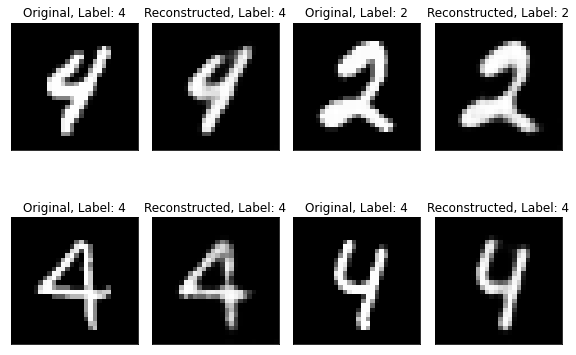

In [ ]:
### Plot some samples from test set
fig, axs = plt.subplots(2, 4, figsize=(8,6))

for ax in axs:
    img, label = random.choice(test_dataset)
    img1 = img[0]
    with torch.no_grad():
        encoded_img  = AE_net.encoder(img.unsqueeze(0).to(device))
        decoded_img  = AE_net.decoder(encoded_img)
    
    ax[0].imshow(np.array(img1), cmap='gist_gray')
    ax[0].set_title('Original, Label: %d' % label)
    ax[0].set_xticks([])
    ax[0].set_yticks([])

    ax[1].imshow(decoded_img.squeeze().cpu().numpy(), cmap='gist_gray')
    ax[1].set_title('Reconstructed, Label: %d' % label)
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    
    img, label = random.choice(test_dataset)
    img1 = img[0]
    with torch.no_grad():
        encoded_img  = AE_net.encoder(img.unsqueeze(0).to(device))
        decoded_img  = AE_net.decoder(encoded_img)
    
    ax[2].imshow(np.array(img1), cmap='gist_gray')
    ax[2].set_title('Original, Label: %d' % label)
    ax[2].set_xticks([])
    ax[2].set_yticks([])

    ax[3].imshow(decoded_img.squeeze().cpu().numpy(), cmap='gist_gray')
    ax[3].set_title('Reconstructed, Label: %d' % label)
    ax[3].set_xticks([])
    ax[3].set_yticks([])
    
    
plt.tight_layout()

## Denoising 

### Define different noises

Taking inspiration from the built-in random noises available in sklearn (skimage.util.random_noise)

In [ ]:
class AddGaussianNoise():
    '''
    Adds random gaussian noise with mean @mean and standard deviation @std to a tensor.

    Inputs:
    mean: default = 0, mean of normal distribution.
    std:  default = 1, standard deviation of normal distribution.
    clip: if True, after adding the noise, restrict values to the [0, 1] range.
    '''
    def __init__(self, mean : float = 0., std : float = 1., clip : bool = True):
        
        self.std = std
        self.mean = mean
        self.clip = clip
    
    def __call__(self, tensor : 'torch.tensor'):
        
        noisy_tensor = tensor + torch.randn(tensor.size(), device=tensor.device) * (self.std ** 0.5) + self.mean
        
        if self.clip:
            return torch.clamp(noisy_tensor, min=0., max=1.)
        else:
            return noisy_tensor
        
class AddSaltPepperNoise(): 
    '''
    Adds "Salt & Pepper" noise to a tensor. 
    Randomly changes elements with probability @amount, setting them to 1 with probability @s_vs_p or to 0. 
    1 = salt(ed) elements, 0 = pepper(ed) elements 

    amount: probability that an entry of tensor will be affected by the noise. 
    s_vs_p: conditional probability that an entry affected by noise is set to 1 rather than 0.
    clip:   if True, after adding the noise, restrict values to the [0, 1] range.
    '''
    def __init__(self, amount : float = 0.05, s_vs_p : float = 0.5, clip : bool = True):
        
        self.amount = amount
        self.s_vs_p = s_vs_p
        self.clip = clip
    
    def __call__(self, tensor : 'torch.tensor'):
        
        affected_by_noise = torch.rand_like(tensor) < self.amount
        salted = torch.rand_like(tensor) < self.s_vs_p
        peppered = ~salted

        noisy_tensor = torch.clone(tensor)
        noisy_tensor[affected_by_noise & salted] = 1
        noisy_tensor[affected_by_noise & peppered] = 0

        if self.clip:
            return torch.clamp(noisy_tensor, min=0., max=1.)
        else:
            return noisy_tensor

class AddSpeckleNoise(): 
    '''
    Adds "Speckle" noise to a tensor, sampled from gaussian distribution of mean @mean and standard deviation @std

    mean: default = 0, mean of normal distribution.
    std:  default = 1, standard deviation of normal distribution.
    clip: if True, after adding the noise, restrict values to the [0, 1] range.
    '''
    def __init__(self, mean : float = 0., std : float = 1., clip : bool = True):
        
        self.std = std
        self.mean = mean
        self.clip = clip
    
    def __call__(self, tensor : 'torch.tensor'):
        
        noisy_tensor = tensor + tensor * (torch.randn(tensor.size(), device=tensor.device) * (self.std ** 0.5) + self.mean)
        
        if self.clip:
            return torch.clamp(noisy_tensor, min=0., max=1.)
        else:
            return noisy_tensor
        

### Check how noise works on a random train sample

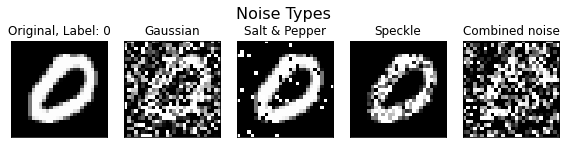

In [ ]:
# pick random sample
img, label = random.choice(train_dataset)

x_gaussian   = AddGaussianNoise(0., 0.5)(img)
x_saltpepper = AddSaltPepperNoise(s_vs_p=0.5, amount=0.1)(img)
x_speckle    = AddSpeckleNoise(0., 0.5)(img)

all_noises = torchvision.transforms.Compose([ AddSpeckleNoise(),
                                              AddSaltPepperNoise(s_vs_p=.5, amount=.05),
                                              AddGaussianNoise(0., 0.5) ])

x_all_noise = all_noises(img)

# Plot original img and noisy ones
fig, ax = plt.subplots(1, 5, figsize=(8,2))

ax[0].imshow(np.array(img[0]), cmap='gist_gray')
ax[1].imshow(x_gaussian.squeeze(0).data.numpy(), cmap='gist_gray')
ax[2].imshow(x_saltpepper.squeeze(0).data.numpy(), cmap='gist_gray')
ax[3].imshow(x_speckle.squeeze(0).data.numpy(), cmap='gist_gray')
ax[4].imshow(x_all_noise.squeeze(0).data.numpy(), cmap='gist_gray')

ax[0].set_title('Original, Label: %d' % label)
ax[1].set_title('Gaussian')
ax[2].set_title('Salt & Pepper')
ax[3].set_title('Speckle')
ax[4].set_title('Combined noise') 

for axs in ax:
    axs.set_xticks([])
    axs.set_yticks([])
    axs.set_xticklabels([])
    axs.set_yticklabels([])

fig.suptitle("Noise Types", fontsize=16)
plt.tight_layout()
plt.show()

### Create dataset with noise

In [ ]:
class Dataset_noise(torch.utils.data.Dataset):
    '''
    Given a @dataset, applies a @noise_transform and generates samples affected by noise.
    If @noise_transform = None, no transformation is applied to the samples. 
    Returns tuple with the samples, the noisy data and the assigned label: (@x, @x_noisy, @y)
    '''
    def __init__(self, dataset : "torch.utils.data.Dataset", noise_transform : "torchvision.transforms"):

        self.dataset = dataset
        self.noise_transform = noise_transform

    def __getitem__(self, index): 
        x, y = self.dataset[index][0], self.dataset[index][1]
        if self.noise_transform == None:
            x_noisy = x
        else:
            x_noisy = self.noise_transform(x)
    
        return x, x_noisy, y

    def __len__(self):
        return len(self.dataset) 

In [ ]:
# datasets
noisy_train = Dataset_noise(noise_transform=all_noises, dataset=train_dataset)
noisy_valid = Dataset_noise(noise_transform=all_noises, dataset=valid_dataset)
# the test set does not have noise
noisy_test  = Dataset_noise(noise_transform=None, dataset=test_dataset)

# dataloaders
noisy_train_load = Data.DataLoader(noisy_train, batch_size=256, shuffle=True, num_workers=0)
noisy_valid_load = Data.DataLoader(noisy_valid, batch_size=256, shuffle=False, num_workers=0)
noisy_test_load  = Data.DataLoader(noisy_test, batch_size=256, shuffle=False, num_workers=0)

In [ ]:
class Denoiser(pl.LightningModule):

    def __init__(self, params):

        super().__init__()
                                                                          
        encoded_space_dim = params['encoded_space_dim']
        n_channels = params['n_channels']
        
        # Encoder
        self.encoder = nn.Sequential( # First convolutional layer
                                      # --> img size = (28-3+2*1)/2+1= 15x15 
                                      nn.Conv2d(1, n_channels, kernel_size=3, padding=1, stride=2),
                                      nn.ReLU(),
                                      # Second convolutional layer
                                      # --> img size = (15-3+2*1)/2+1= 8x8 
                                      nn.Conv2d(n_channels, 2*n_channels, kernel_size=3, padding=1, stride=2),
                                      nn.ReLU(),
                                      # Third convolutional layer
                                      # --> img size = (8-3+2*0)/2+1= 3x3
                                      nn.Conv2d(2*n_channels, 4*n_channels, kernel_size=3, padding=0, stride=2),
                                      nn.ReLU(),
                                      # Flatten layer
                                      nn.Flatten(start_dim=1),
                                      # First linear layer
                                      # number of input units = (img size)x(4*n_channels) = 36*n_channels
                                      nn.Linear(36*n_channels, 64), # arbitrary number of output units
                                      nn.ReLU(),
                                      # Second linear layer (output layer)
                                      nn.Linear(64, encoded_space_dim)
                                    )
        # Decoder
        self.decoder =  nn.Sequential( # First linear layer
                                       nn.Linear(encoded_space_dim, 64), 
                                       nn.ReLU(True),
                                       # Second linear layer
                                       # number of input units = (img size)x(4*n_channels) = 36*n_channels
                                       nn.Linear(64, 36*n_channels), 
                                       nn.ReLU(True),
                                       # Unflatten, fix images dimensions: 4*n_channels, 3x3 imgs 
                                       nn.Unflatten(dim=1, unflattened_size=(4*n_channels, 3, 3)),
                                       # First transposed convolution
                                       # --> img size = (3-1)*2-2*0+3-1+0+1 = 7x7
                                       nn.ConvTranspose2d(4*n_channels, 2*n_channels, kernel_size=3, 
                                                           output_padding=0, stride=2),
                                        nn.ReLU(True),
                                        # Second transposed convolution
                                       # --> img size = (7-1)*2-2*1+3-1+1+1 = 14x14
                                        nn.ConvTranspose2d(2*n_channels, n_channels, kernel_size=3, 
                                                           output_padding=1, padding=1, stride=2),
                                        nn.ReLU(True),
                                        # Third transposed convolution
                                       # --> img size = (14-1)*2-2*1+3-1+1+1 = 28x28
                                        nn.ConvTranspose2d(n_channels, 1, kernel_size=3, 
                                                           output_padding=1, padding=1, stride=2),
                                        # To obtain an output in [0,1]
                                        nn.Sigmoid()
                                    )
        self.configure_loss(loss_func)

    def forward(self, x):
        # With Pytorch Lightning, training is separated from inference. 
        # The forward defines inference actions.
        embedding = self.encoder(x)
        return embedding

    def training_step(self, batch, batch_idx):
        # With Pytorch Lightning, training is separated from inference. 
        # The training_step defines the full training loop. 
        x, x_noise, y = batch  # consider noise
        z = self.encoder(x_noise)
        x_hat = self.decoder(z)
        train_loss = self.loss_func(x_hat, x)
        self.log('train_loss', train_loss)
        return train_loss
    
    def validation_step(self, batch, batch_idx, loss_name='valid_loss'): 
        # Similarly to the training_step we define the validation_step 
        x, x_noise, y = batch
        z = self.encoder(x_noise)
        x_hat = self.decoder(z)
        val_loss = self.loss_func(x_hat, x)
        self.log(loss_name, val_loss, prog_bar=True)
        return val_loss
    
    def test_step(self, batch, batch_idx):
        self.validation_step(batch, batch_idx, loss_name='test_loss')

    def configure_optimizers(self):
        lr  = 0.001762965593327283
        wd  = 3.51339280579307e-06
        mom = 0.8897156643172137
        optimizer = torch.optim.Adam(self.parameters(), lr=lr, weight_decay=wd)
        return optimizer
    
    def configure_loss(self, loss_func):
        self.loss_func = loss_func

In [ ]:
# Initialise the final best network
# test_p = {'encoded_space_dim': 67, 'n_channels': 9}
denoiser = Denoiser(best_params)

### Check image sizes
# Take an input image (remember to add the batch dimension)
img, _ = test_dataset[0]
img = img.unsqueeze(0) # Add the batch dimension in the first axis
print('Original image shape:', img.shape)
# Encode the image
img_enc = denoiser.encoder(img)
print('Encoded image shape:', img_enc.shape)
img_enc = denoiser.forward(img)
print('Encoded image shape (forward pass):', img_enc.shape)
# Decode the image
dec_img = denoiser.decoder(img_enc)
print('Decoded image shape:', dec_img.shape)

In [ ]:
### Define the loss function
loss_func = nn.MSELoss()
# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

# Move both the encoder and the decoder to the selected device
denoiser.to(device)
denoiser.configure_loss(loss_func)

trainer = pl.Trainer(gpus=0, max_epochs=100, progress_bar_refresh_rate=20, 
                     callbacks=[EarlyStopping(monitor='valid_loss')])

GPU available: False, used: False
TPU available: None, using: 0 TPU cores


In [ ]:
trainer.fit(denoiser, noisy_train_load, noisy_valid_load)


  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 32.6 K
1 | decoder   | Sequential | 32.8 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
65.4 K    Trainable params
0         Non-trainable params
65.4 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

1

In [ ]:
trainer.test(denoiser, noisy_test_load)

Testing: 0it [00:00, ?it/s]

--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_loss': 0.020860321819782257}
--------------------------------------------------------------------------------


[{'test_loss': 0.020860321819782257}]

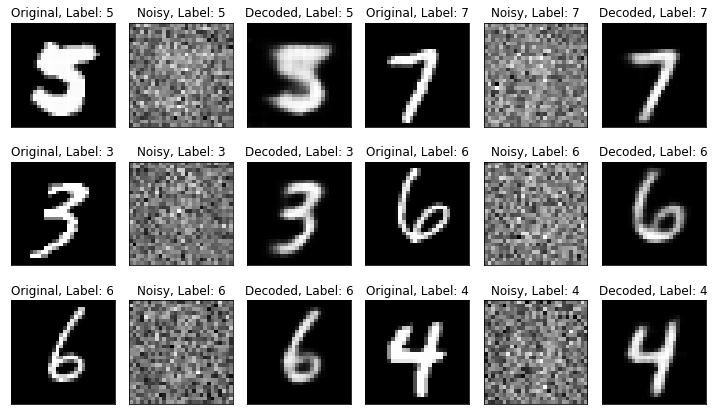

In [ ]:
### Plot some sample
fig, axs = plt.subplots(3, 6, figsize=(10,6))
for ax in axs:
    # random.choice allows to randomly sample from a list-like object (basically anything that can be accessed with an index, like our dataset)
    img, label = random.choice(test_dataset)
    img1 = img[0]
    ax[0].imshow(np.array(img1), cmap='gist_gray')
    ax[0].set_title('Original, Label: %d' % label)
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    
    img1 = img1 + np.random.normal(0, 1, size=img1.shape)
    ax[1].imshow(np.array(img1), cmap='gist_gray')
    ax[1].set_title('Noisy, Label: %d' % label)
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    
    img = img.unsqueeze(0).to(device)
    denoiser.eval()
    with torch.no_grad():
        encoded_img  = denoiser.encoder(img)
        decoded_img  = denoiser.decoder(encoded_img)
    ax[2].imshow(np.array(decoded_img.cpu()[0][0]), cmap='gist_gray')
    ax[2].set_title('Decoded, Label: %d' % label)
    ax[2].set_xticks([])
    ax[2].set_yticks([])
    
    # random.choice allows to randomly sample from a list-like object (basically anything that can be accessed with an index, like our dataset)
    img, label = random.choice(train_dataset)
    img1 = img[0]
    ax[3].imshow(np.array(img1), cmap='gist_gray')
    ax[3].set_title('Original, Label: %d' % label)
    ax[3].set_xticks([])
    ax[3].set_yticks([])
    
    img1 = img1 + np.random.normal(0, 1, size=img1.shape)
    ax[4].imshow(np.array(img1), cmap='gist_gray')
    ax[4].set_title('Noisy, Label: %d' % label)
    ax[4].set_xticks([])
    ax[4].set_yticks([])
    
    img = img.unsqueeze(0).to(device)
    denoiser.eval()
    with torch.no_grad():
        encoded_img  = denoiser.encoder(img)
        decoded_img  = denoiser.decoder(encoded_img)
    ax[5].imshow(np.array(decoded_img.cpu()[0][0]), cmap='gist_gray')
    ax[5].set_title('Decoded, Label: %d' % label)
    ax[5].set_xticks([])
    ax[5].set_yticks([])
    
plt.tight_layout()

## Fine tuning

In [ ]:
class Supervised_decoder(pl.LightningModule):

    def __init__(self, encoded_space_dim, pre_net):

        super().__init__()
        # Encoder
        self.encoder = pre_net.encoder
        # Decoder is substituted with fine tuner with two fully connected layers
        # The first one is just like the first one of the decoder
        # The second one divides into 10 cathegories the outputs (10 digits)
        # the logsoftmax activation functions generates probability classes
        self.fine_tuner =  nn.Sequential( nn.Linear(encoded_space_dim, 64),
                                          nn.ReLU(True),
                                          nn.Linear(64, 10),
                                          nn.LogSoftmax()
                                         )
        
        self.accuracy = pl.metrics.Accuracy() # to evaluate final performances
        
    def forward(self, x):
        x = self.encoder(x)
        x = self.fine_tuner(x)
        return x

    def training_step(self, batch, batch_idx):
        # training_step defined the train loop. It is independent of forward
        x, y = batch
        z = self.forward(x)
        train_loss = self.loss_func(z, y)
        self.log('train_loss', train_loss)
        return train_loss
    
    def validation_step(self, batch, batch_idx, loss_name='valid_loss'):
        x, y = batch
        z = self.forward(x)
        valid_loss = self.loss_func(z, y)
        self.log(loss_name, valid_loss, prog_bar=True)
        return valid_loss
    
    def test_step(self, batch, batch_idx):
        x, y = batch
        z = self.forward(x)
        self.log('accuracy', self.accuracy(z, y), prog_bar=True)
        return self.accuracy(z, y)

    def configure_optimizers(self):
        lr  = 0.001762965593327283
        wd  = 3.51339280579307e-06
        mom = 0.8897156643172137
        optimizer = torch.optim.Adam(self.parameters(), lr=lr, weight_decay=wd)
        return optimizer
    
    def configure_loss(self, loss_func):
        self.loss_func = loss_func

In [ ]:
pre_net = AutoEncoder.load_from_checkpoint(checkpoint_path="best_net_checkpoints.ckpt", params=best_params)
fine_tuner = Supervised_decoder(best_params['encoded_space_dim'], pre_net)

# Freeze params
for param in fine_tuner.encoder.parameters():
    param.requires_grad = False

loss_func_NLL = torch.nn.NLLLoss()

fine_tuner.configure_loss(loss_func_NLL)
fine_tuner.to(device)


Supervised_decoder(
  (encoder): Sequential(
    (0): Conv2d(1, 9, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(9, 18, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU()
    (4): Conv2d(18, 36, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU()
    (6): Flatten(start_dim=1, end_dim=-1)
    (7): Linear(in_features=324, out_features=64, bias=True)
    (8): ReLU()
    (9): Linear(in_features=64, out_features=67, bias=True)
  )
  (fine_tuner): Sequential(
    (0): Linear(in_features=67, out_features=64, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=64, out_features=10, bias=True)
    (3): LogSoftmax(dim=None)
  )
  (accuracy): Accuracy()
  (loss_func): NLLLoss()
)

In [ ]:
# Training fine tuner
trainer = pl.Trainer(gpus=0, max_epochs=100, progress_bar_refresh_rate=20, 
                     callbacks=[EarlyStopping(monitor='valid_loss')])

trainer.fit(fine_tuner, train_load, valid_load)

GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 32.6 K
1 | fine_tuner | Sequential | 5.0 K 
2 | accuracy   | Accuracy   | 0     
3 | loss_func  | NLLLoss    | 0     
------------------------------------------
5.0 K     Trainable params
32.6 K    Non-trainable params
37.6 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

D:\Anaconda\envs\nndl\lib\site-packages\torch\nn\modules\container.py:119: UserWarning:

Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.



Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

1

In [ ]:
# Test final accuracy
trainer.test(fine_tuner, test_load)

Testing: 0it [00:00, ?it/s]

--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'accuracy': 0.9793000221252441}
--------------------------------------------------------------------------------


[{'accuracy': 0.9793000221252441}]

## Network features analysis
explore the latent space structure (e.g., PCA, t-SNE) and generate new samples from latent codes

In [19]:
# Load network parameters
best_params = {'encoded_space_dim': 67, 'n_channels': 9} #### PUT ENCODED_SPACE_DIM, N_CHANNELS
AE_net = AutoEncoder.load_from_checkpoint("best_net_checkpoints.ckpt", params=best_params).to(device)
# AE_net = AutoEncoder.load_from_checkpoint("ae_checkpoints.ckpt", params=best_params).to(device)

In [20]:
### Get the encoded representation of the test samples
encoded_samples = []

for img, label in tqdm(test_dataset):
    
    img = img.unsqueeze(0).to(device)
    
    # Encode image
    AE_net.eval()    
    with torch.no_grad():
        encoded_img  = AE_net.encoder(img)
    
    # store encoded images and convert to numpy
    encoded_img = encoded_img.flatten().cpu().numpy()
    encoded_sample = {f"Enc. Variable {i}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = label
    encoded_samples.append(encoded_sample)
    

100%|███████████████████████████████████████████████████████████████████████████| 10000/10000 [00:21<00:00, 455.73it/s]


In [21]:
# Convert to a dataframe
encoded_samples = pd.DataFrame(encoded_samples)

# PCA
n_components = 2
pca = PCA(n_components=n_components)
pca.fit(encoded_samples.iloc[:,0:best_params['encoded_space_dim']])
columns = [ f'Enc. Variable {i}' for i in range(n_components)]
compressed_samples = pd.DataFrame( pca.transform(encoded_samples.iloc[:,0:best_params['encoded_space_dim']]), 
                                  columns=columns )

fig = px.scatter(compressed_samples, x='Enc. Variable 0', y='Enc. Variable 1', 
                 color=encoded_samples.label.astype(str), opacity=0.7)

fig.show()

In [22]:
# Convert to a dataframe
encoded_samples = pd.DataFrame(encoded_samples)

# t-SNE
n_components = 2
tsne = TSNE(n_components=n_components)
tsne.fit(encoded_samples.iloc[:, 0:best_params['encoded_space_dim']])
columns = [ f'Enc. Variable {i}' for i in range(n_components)]
compressed_samples = pd.DataFrame( tsne.fit_transform(encoded_samples.iloc[:,0:best_params['encoded_space_dim']]), 
                                   columns=columns )

fig = px.scatter(compressed_samples, x='Enc. Variable 0', y='Enc. Variable 1', 
                 color=encoded_samples.label.astype(str), opacity=0.7)

fig.show()

### Generate new samples

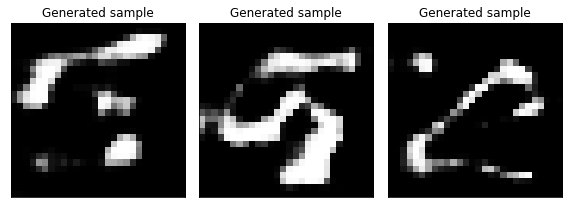

In [23]:
### Plot some samples
fig, ax = plt.subplots(1, 3, figsize=(8,6))

img, label = random.choice(test_dataset)
img1 = img[0]
with torch.no_grad():
    encoded_img  = AE_net.encoder(img.unsqueeze(0).to(device))
    decoded_img  = AE_net.decoder(20*torch.randn_like(encoded_img).to(device) )

ax[0].imshow( decoded_img.squeeze().cpu().numpy(), cmap='gist_gray')
ax[0].set_title('Generated sample' )
ax[0].set_xticks([])
ax[0].set_yticks([])

with torch.no_grad():
    decoded_img  = AE_net.decoder(20*torch.randn_like(encoded_img).to(device) )

ax[1].imshow(decoded_img.squeeze().cpu().numpy(), cmap='gist_gray')
ax[1].set_title('Generated sample' )
ax[1].set_xticks([])
ax[1].set_yticks([])

with torch.no_grad():
    decoded_img  = AE_net.decoder(20*torch.randn_like(encoded_img).to(device) )

ax[2].imshow(decoded_img.squeeze().cpu().numpy(), cmap='gist_gray')
ax[2].set_title('Generated sample' )
ax[2].set_xticks([])
ax[2].set_yticks([])    
    
plt.tight_layout()

## Variational AutoEncoder

Between encoder and decoder add some layers to mimick a probability distribution and to hence "sample" the encoded pictures.

In [24]:
class VariationalAE(pl.LightningModule):

    def __init__(self, params):

        super().__init__()
                                                                          
        encoded_space_dim = params['encoded_space_dim']
        n_channels = params['n_channels']
        
        # Encoder
        self.encoder = nn.Sequential( # First convolutional layer
                                      nn.Conv2d(1, n_channels, kernel_size=3, padding=1, stride=2),
                                      nn.ReLU(),
                                      # Second convolutional layer
                                      nn.Conv2d(n_channels, 2*n_channels, kernel_size=3, padding=1, stride=2),
                                      nn.ReLU(),
                                      # Third convolutional layer
                                      nn.Conv2d(2*n_channels, 4*n_channels, kernel_size=3, padding=0, stride=2),
                                      nn.ReLU(),
                                      # Flatten layer
                                      nn.Flatten(start_dim=1)
                                    )
        # fully connected layers for learning representations
        #### LATENT SPACE ####
        # for sampling gaussian means
        self.fc_mus = nn.Sequential( # First linear layer
                                    nn.Linear(36*n_channels, 64),
                                    nn.ReLU(),
                                    # Second linear layer
                                    nn.Linear(64, encoded_space_dim)
                                   )
        # for sampling diagonal of covariance matrix
        self.fc_sigma = nn.Sequential( # First linear layer
                                       nn.Linear(36*n_channels, 64),
                                       nn.ReLU(),
                                       # Second linear layer
                                       nn.Linear(64, encoded_space_dim)
                                      )
        # Decoder
        self.decoder =  nn.Sequential( # First linear layer
                                       nn.Linear(encoded_space_dim, 64),
                                       nn.ReLU(True),
                                       # Second linear layer
                                       nn.Linear(64, 36*n_channels),
                                       nn.ReLU(True),
                                       # Unflatten
                                       nn.Unflatten(dim=1, unflattened_size=(4*n_channels, 3, 3)),
                                       # First transposed convolution
                                       nn.ConvTranspose2d(4*n_channels, 2*n_channels, kernel_size=3, output_padding=0, stride=2),
                                       nn.ReLU(True),
                                       # Second transposed convolution
                                       nn.ConvTranspose2d(2*n_channels, n_channels, kernel_size=3, output_padding=1, padding=1, stride=2),
                                       nn.ReLU(True),
                                       # Third transposed convolution
                                       nn.ConvTranspose2d(n_channels, 1, kernel_size=3, output_padding=1, padding=1, stride=2),
                                       # To obtain an output in [0,1]
                                       nn.Sigmoid()
                                     )
        
    def forward(self, x):
        # in lightning, forward defines the prediction/inference actions
        # define the sampling (=inference) process
        encode = self.encoder(x)
        mus    = self.fc_mus(encode)
        sigma  = self.fc_sigma(encode)
        sample = sigma*torch.randn(sigma.size()).to(self.device) + mus
        return sample

    def training_step(self, batch, batch_idx):
        # training_step defined the train loop. It is independent of forward
        x, y = batch
        # encode
        encode = self.encoder(x)
        mus    = self.fc_mus(encode)
        sigma  = self.fc_sigma(encode)
        # Sampling (reparametrization trick)
        z = sigma * torch.randn(sigma.size()).to(self.device) + mus
        # decode
        x_hat = self.decoder(z)
        # compute loss
        train_loss = self.loss_func(x_hat, x) + self.kl_reg * self._KL_divergence(mus, sigma)
        self.log('train_loss', train_loss)
        
        return train_loss
    
    def validation_step(self, batch, batch_idx, loss_name='valid_loss'):
        x, y = batch
        # encode
        encode = self.encoder(x)
        mus    = self.fc_mus(encode)
        sigma  = self.fc_sigma(encode)
        # Sampling with reparametrization trick
        z = sigma*torch.randn(sigma.size()).to(self.device) + mus
        # decode
        x_hat = self.decoder(z)
        # compute loss
        valid_loss = self.loss_func(x_hat, x) + self.kl_reg*self._KL_divergence(mus, sigma)
        self.log(loss_name, valid_loss, prog_bar=True)
        return valid_loss
    
    def test_step(self, batch, batch_idx):
        self.validation_step(batch, batch_idx, loss_name='test_loss')

    def configure_optimizers(self):
        lr  = 0.001762965593327283
        wd  = 3.51339280579307e-06
        mom = 0.8897156643172137
        optimizer = torch.optim.Adam(self.parameters(), lr=lr, weight_decay=wd)
        return optimizer
    
    def configure_loss(self, loss_func, kl_reg):
        self.loss_func = loss_func
        self.kl_reg = kl_reg
        
    def _KL_divergence(self, mu, sigma):
        kl_div = 0.5*torch.sum( sigma**2 + mu**2 - 1 - torch.log( sigma**2 ) )
        return kl_div

In [25]:
### Initialize the two networks
vae = VariationalAE(best_params)

### Define the loss function
loss_func = nn.MSELoss()
# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

# Move both the encoder and the decoder to the selected device
vae.to(device)
vae.configure_loss(loss_func, 1e-5)

In [ ]:
# Training
trainer = pl.Trainer(gpus=0, max_epochs=100, progress_bar_refresh_rate=20, 
                     callbacks=[EarlyStopping(monitor='valid_loss')])
trainer.fit(vae, train_load, valid_load)

GPU available: False, used: False
TPU available: None, using: 0 TPU cores

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 7.4 K 
1 | fc_mus    | Sequential | 25.2 K
2 | fc_sigma  | Sequential | 25.2 K
3 | decoder   | Sequential | 32.8 K
4 | loss_func | MSELoss    | 0     
-----------------------------------------
90.6 K    Trainable params
0         Non-trainable params
90.6 K    Total params


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

1

In [ ]:
# Test accuracy
trainer.test(vae, test_load)

Testing: 0it [00:00, ?it/s]

--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_loss': 0.048588093370199203}
--------------------------------------------------------------------------------


[{'test_loss': 0.048588093370199203}]

In [ ]:
trainer.save_checkpoint("vae.ckpt")

### See Variational AutoEncoder results

In [26]:
# load vae network
vae = VariationalAE.load_from_checkpoint("vae.ckpt", params=best_params).to(device)

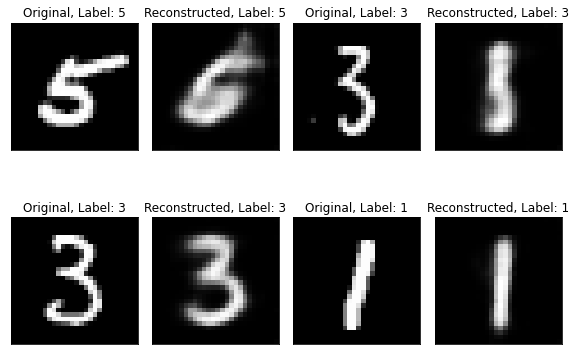

In [33]:
### Plot some samples from test set
fig, axs = plt.subplots(2, 4, figsize=(8,6))

for ax in axs:
    img, label = random.choice(test_dataset)
    img1 = img[0]
    with torch.no_grad():
        encoded_img  = vae.forward(img.unsqueeze(0).to(device))
        decoded_img  = vae.decoder(encoded_img)
    
    ax[0].imshow(np.array(img1), cmap='gist_gray')
    ax[0].set_title('Original, Label: %d' % label)
    ax[0].set_xticks([])
    ax[0].set_yticks([])

    ax[1].imshow(decoded_img.squeeze().cpu().numpy(), cmap='gist_gray')
    ax[1].set_title('Reconstructed, Label: %d' % label)
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    
    img, label = random.choice(test_dataset)
    img1 = img[0]
    with torch.no_grad():
        encoded_img  = vae.forward(img.unsqueeze(0).to(device))
        decoded_img  = vae.decoder(encoded_img)
    
    ax[2].imshow(np.array(img1), cmap='gist_gray')
    ax[2].set_title('Original, Label: %d' % label)
    ax[2].set_xticks([])
    ax[2].set_yticks([])

    ax[3].imshow(decoded_img.squeeze().cpu().numpy(), cmap='gist_gray')
    ax[3].set_title('Reconstructed, Label: %d' % label)
    ax[3].set_xticks([])
    ax[3].set_yticks([])
    
    
plt.tight_layout()

### Generate new samples

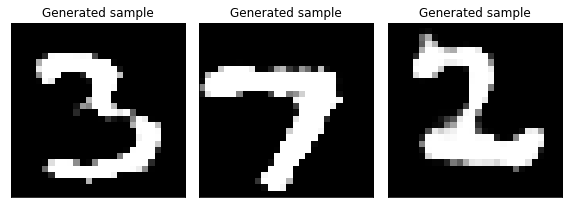

In [61]:
### Plot some samples
fig, ax = plt.subplots(1, 3, figsize=(8,6))

img, label = random.choice(test_dataset)
img1 = img[0]
with torch.no_grad():
    encoded_img  = vae.forward(img.unsqueeze(0).to(device))
    decoded_img  = vae.decoder(15*torch.randn_like(encoded_img).to(device) )

ax[0].imshow( decoded_img.squeeze().cpu().numpy(), cmap='gist_gray')
ax[0].set_title('Generated sample' )
ax[0].set_xticks([])
ax[0].set_yticks([])

with torch.no_grad():
    decoded_img  = vae.decoder(15*torch.randn_like(encoded_img).to(device) )

ax[1].imshow(decoded_img.squeeze().cpu().numpy(), cmap='gist_gray')
ax[1].set_title('Generated sample' )
ax[1].set_xticks([])
ax[1].set_yticks([])

with torch.no_grad():
    decoded_img  = vae.decoder(15*torch.randn_like(encoded_img).to(device) )

ax[2].imshow(decoded_img.squeeze().cpu().numpy(), cmap='gist_gray')
ax[2].set_title('Generated sample' )
ax[2].set_xticks([])
ax[2].set_yticks([])    
    
plt.tight_layout()

## VAE network features analysis
explore the latent space structure (e.g., PCA, t-SNE) and generate new samples from latent codes

In [49]:
# Load network parameters
vae = VariationalAE.load_from_checkpoint("vae.ckpt", params=best_params).to(device)

In [53]:
### Get the encoded representation of the test samples
encoded_samples = []

for sample in tqdm(test_dataset):
    img = sample[0].unsqueeze(0).to(device)
    label = sample[1]

    # Encode image
    vae.eval()
    with torch.no_grad():
        encoded_img  = vae.forward(img)
    
    # Append to list
    encoded_img = encoded_img.flatten().cpu().numpy()
    encoded_sample = {f"Enc. Variable {i}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = label
    encoded_samples.append(encoded_sample)
    

100%|███████████████████████████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 923.05it/s]


In [54]:
# Convert to a dataframe
encoded_samples = pd.DataFrame(encoded_samples)

# PCA
n_components = 2
pca = PCA(n_components=n_components)
pca.fit(encoded_samples.iloc[:,0:best_params['encoded_space_dim']])
columns = [ f'Enc. Variable {i}' for i in range(n_components)]
compressed_samples = pd.DataFrame( pca.transform(encoded_samples.iloc[:,0:best_params['encoded_space_dim']]), 
                                  columns=columns )

fig = px.scatter(compressed_samples, x='Enc. Variable 0', y='Enc. Variable 1', 
                 color=encoded_samples.label.astype(str), opacity=0.7)

fig.show()

In [55]:
# Convert to a dataframe
encoded_samples = pd.DataFrame(encoded_samples)

# t-SNE
n_components = 2
tsne = TSNE(n_components=n_components)
tsne.fit(encoded_samples.iloc[:, 0:best_params['encoded_space_dim']])
columns = [ f'Enc. Variable {i}' for i in range(n_components)]
compressed_samples = pd.DataFrame( tsne.fit_transform(encoded_samples.iloc[:,0:best_params['encoded_space_dim']]), 
                                   columns=columns )

fig = px.scatter(compressed_samples, x='Enc. Variable 0', y='Enc. Variable 1', 
                 color=encoded_samples.label.astype(str), opacity=0.7)

fig.show()